In [150]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from datetime import date
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

### Load Transaction and Demographic file

In [151]:
train_transaction = pd.read_csv("ExistingCustomersTransactionsData.csv")
train_demographic = pd.read_csv("ExisitngCustomerDemographics.csv")

In [152]:
print("train_transaction.shape : ",train_transaction.shape)
print("train_demographic.shape : ",train_demographic.shape)

train_transaction.shape :  (29982, 7)
train_demographic.shape :  (2379, 5)


In [153]:
print(train_transaction.dtypes)
print('-----------------------')
print(train_demographic.dtypes)

BillNumber          object
BillDate            object
CustomerID          object
ProductID           object
ProductCategory     object
Sales              float64
Quantity             int64
dtype: object
-----------------------
CustomerID       object
DOB              object
gender           object
MaritalStatus    object
Familysize        int64
dtype: object


In [154]:
train_transaction.head()

,BillNumber,BillDate,CustomerID,ProductID,ProductCategory,Sales,Quantity
0,B32607,2014-01-03,C14797,PR7138,Office Supplies,16.448,2
1,B37616,2014-01-03,C13917,PR7138,Office Supplies,16.448,2
2,B42625,2014-01-03,C14353,PR7138,Office Supplies,16.448,2
3,B32712,2014-01-04,C13351,PR7099,Office Supplies,11.784,3
4,B32712,2014-01-04,C13351,PR7490,Office Supplies,272.736,3


In [155]:
train_demographic.head()

,CustomerID,DOB,gender,MaritalStatus,Familysize
0,C12551,1999-12-19,M,Yes,2
1,C12552,1985-06-14,M,No,1
2,C12553,1985-11-21,M,Yes,4
3,C12554,1984-02-01,M,Yes,4
4,C12555,1998-04-05,F,Yes,2


### Drop Duplicates

Unique Customer Count is 2379

In [156]:
train_demographic.drop_duplicates(subset='CustomerID',inplace=True)
train_demographic.shape

(2379, 5)

All CustomerIDs in Demographic file is unique.

### Remove BillNumber, BillDate and ProductID columns

In [157]:
train_transaction.drop(['BillNumber','BillDate','ProductID'], axis=1, inplace=True)
train_transaction.head()

,CustomerID,ProductCategory,Sales,Quantity
0,C14797,Office Supplies,16.448,2
1,C13917,Office Supplies,16.448,2
2,C14353,Office Supplies,16.448,2
3,C13351,Office Supplies,11.784,3
4,C13351,Office Supplies,272.736,3


In [158]:
train_demographic.head()

,CustomerID,DOB,gender,MaritalStatus,Familysize
0,C12551,1999-12-19,M,Yes,2
1,C12552,1985-06-14,M,No,1
2,C12553,1985-11-21,M,Yes,4
3,C12554,1984-02-01,M,Yes,4
4,C12555,1998-04-05,F,Yes,2


### Change Demographic file attribute to categorical & Dummify.

In [159]:
demogr_cat = ['gender','MaritalStatus','Familysize']
for cat in demogr_cat:
    train_demographic[cat] = train_demographic[cat].astype('category')

demogr_cat_df = train_demographic[demogr_cat]
dem_cat_dummies = pd.get_dummies(demogr_cat_df, drop_first=True)
train_demographic = pd.concat([train_demographic,dem_cat_dummies], axis=1)
train_demographic.drop(['gender','MaritalStatus','Familysize'], axis=1, inplace=True)
train_demographic.head()

,CustomerID,DOB,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4
0,C12551,1999-12-19,1,1,1,0,0
1,C12552,1985-06-14,1,0,0,0,0
2,C12553,1985-11-21,1,1,0,0,1
3,C12554,1984-02-01,1,1,0,0,1
4,C12555,1998-04-05,0,1,1,0,0


### Create a new field "Age" from DOB field in Demographic file

In [160]:
# Convert "DOB" to datetime format
train_demographic["DOB"] = pd.to_datetime(train_demographic["DOB"], format='%Y-%m-%d')
train_demographic.head()

,CustomerID,DOB,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4
0,C12551,1999-12-19,1,1,1,0,0
1,C12552,1985-06-14,1,0,0,0,0
2,C12553,1985-11-21,1,1,0,0,1
3,C12554,1984-02-01,1,1,0,0,1
4,C12555,1998-04-05,0,1,1,0,0


In [161]:
def calculateAge(birthDate): 
    today = date.today() 
    age = today.year - birthDate.year - ((today.month, today.day) < (birthDate.month, birthDate.day))   
    return age 

In [162]:
age = []
for d in train_demographic["DOB"]:
    age.append(calculateAge(date(d.year, d.month, d.day)))

train_demographic['Age'] = age
train_demographic.drop(['DOB'], axis=1, inplace=True)

In [163]:
train_demographic.head()

,CustomerID,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4,Age
0,C12551,1,1,1,0,0,19
1,C12552,1,0,0,0,0,33
2,C12553,1,1,0,0,1,33
3,C12554,1,1,0,0,1,35
4,C12555,0,1,1,0,0,20


### Group transaction data based on "CustomerID" and "ProductCategory"

In [164]:
train_transaction = train_transaction.groupby(['CustomerID','ProductCategory'])['Sales','Quantity'].sum().unstack().reset_index().fillna(0).set_index('CustomerID')
train_transaction.head()

Sales                             Quantity  \
ProductCategory  Furniture Office Supplies Technology Furniture   
CustomerID                                                        
C12551            903.0900         219.288   1766.128      22.0   
C12552           1025.1760         228.118    928.185      24.0   
C12553           1345.7800         489.928    620.930      11.0   
C12554           1225.1600        2161.074    446.080      11.0   
C12555           2860.0848        1258.118   1359.858      33.0   

                                            
ProductCategory Office Supplies Technology  
CustomerID                                  
C12551                     43.0       13.0  
C12552                     35.0       16.0  
C12553                     32.0        5.0  
C12554                     35.0        7.0  
C12555                     73.0       18.0

In [165]:
print(train_transaction.shape)
print(train_demographic.shape)

(2379, 6)
(2379, 7)


### Combine records in transaction files based on Customer IDs and ProductCategory

In [166]:
#base_train = pd.merge(train_transaction1,train_demographic, on=['CustomerID'])
train_transaction = train_transaction.merge(train_demographic, on=['CustomerID'])

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\reshape\merge.py:544: UserWarning: merging between different levels can give an unintended result (2 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


In [167]:
train_transaction.head()

,CustomerID,"(Sales, Furniture)","(Sales, Office Supplies)","(Sales, Technology)","(Quantity, Furniture)","(Quantity, Office Supplies)","(Quantity, Technology)",gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4,Age
0,C12551,903.0900,219.288,1766.128,22.0,43.0,13.0,1,1,1,0,0,19
1,C12552,1025.1760,228.118,928.185,24.0,35.0,16.0,1,0,0,0,0,33
2,C12553,1345.7800,489.928,620.930,11.0,32.0,5.0,1,1,0,0,1,33
3,C12554,1225.1600,2161.074,446.080,11.0,35.0,7.0,1,1,0,0,1,35
4,C12555,2860.0848,1258.118,1359.858,33.0,73.0,18.0,0,1,1,0,0,20


### Rename the columns

In [168]:
train_transaction.columns = ['CustomerID','Furniture_Sales','OfficeSupplies_Sales','Technology_Sales','Furniture_Quantity','OfficeSupplies_Quantity','Technology_Quantity','gender_M','MaritalStatus_Yes','Familysize_2','Familysize_3','Familysize_4','Age']

In [169]:
train_transaction.head()

,CustomerID,Furniture_Sales,OfficeSupplies_Sales,Technology_Sales,Furniture_Quantity,OfficeSupplies_Quantity,Technology_Quantity,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4,Age
0,C12551,903.0900,219.288,1766.128,22.0,43.0,13.0,1,1,1,0,0,19
1,C12552,1025.1760,228.118,928.185,24.0,35.0,16.0,1,0,0,0,0,33
2,C12553,1345.7800,489.928,620.930,11.0,32.0,5.0,1,1,0,0,1,33
3,C12554,1225.1600,2161.074,446.080,11.0,35.0,7.0,1,1,0,0,1,35
4,C12555,2860.0848,1258.118,1359.858,33.0,73.0,18.0,0,1,1,0,0,20


### Heat Map to verify multicolinearity

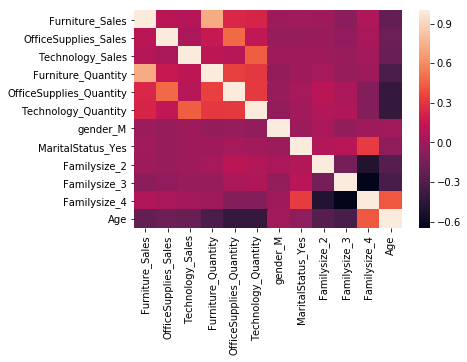

In [170]:
sns.heatmap(train_transaction.corr())

## Clustering on Train Data

In [171]:
train_transaction.dtypes

CustomerID                  object
Furniture_Sales            float64
OfficeSupplies_Sales       float64
Technology_Sales           float64
Furniture_Quantity         float64
OfficeSupplies_Quantity    float64
Technology_Quantity        float64
gender_M                     uint8
MaritalStatus_Yes            uint8
Familysize_2                 uint8
Familysize_3                 uint8
Familysize_4                 uint8
Age                          int64
dtype: object

In [172]:
num = ['Furniture_Sales','OfficeSupplies_Sales','Technology_Sales','Furniture_Quantity','OfficeSupplies_Quantity','Technology_Quantity','Age']

In [173]:
standard_train_transac = train_transaction.copy()
standard_test_transac = test_transaction.copy()

In [174]:
sc = StandardScaler()
standard_train_transac[num] = sc.fit_transform(standard_train_transac[num])
standard_test_transac[num] = sc.transform(standard_test_transac[num])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until


### Select appropriet Cluster No.

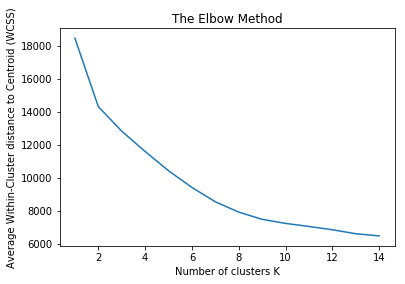

In [175]:
X=standard_train_transac.iloc[:,1:]
wcss = []
for i in range(1,15):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init= 10, random_state= 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,15),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters K')
plt.ylabel('Average Within-Cluster distance to Centroid (WCSS)')  
plt.show()

In [176]:
# Creating 4 Clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
labels = kmeans.labels_
print(labels)
#cluster_new=standard_train_transac.copy()
train_transaction['cluster_pred']=kmeans.fit_predict(X)
print(cluster_new.shape)

[1 1 3 ... 0 3 1]
(2379, 14)


In [177]:
sum=train_transaction.groupby('cluster_pred')['CustomerID'].count()
sum.head()

cluster_pred
0    239
1    916
2    324
3    900
Name: CustomerID, dtype: int64

### Final Transaction Data

In [178]:
train_transaction.head()

,CustomerID,Furniture_Sales,OfficeSupplies_Sales,Technology_Sales,Furniture_Quantity,OfficeSupplies_Quantity,Technology_Quantity,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4,Age,cluster_pred
0,C12551,903.0900,219.288,1766.128,22.0,43.0,13.0,1,1,1,0,0,19,2
1,C12552,1025.1760,228.118,928.185,24.0,35.0,16.0,1,0,0,0,0,33,3
2,C12553,1345.7800,489.928,620.930,11.0,32.0,5.0,1,1,0,0,1,33,3
3,C12554,1225.1600,2161.074,446.080,11.0,35.0,7.0,1,1,0,0,1,35,3
4,C12555,2860.0848,1258.118,1359.858,33.0,73.0,18.0,0,1,1,0,0,20,0


### Split data into Predictor & Target

In [179]:
X = train_transaction.iloc[:,1:13]
y = train_transaction.iloc[:,13:14]

In [180]:
# Split into train & test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [181]:
print(X_train.shape)
print(X_test.shape)

(1665, 12)
(714, 12)


### Building Decision Tree Algorithm

In [182]:
dtc = DecisionTreeClassifier(criterion='entropy')
dtc.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [183]:
# Predicting on train data
pred_train = dtc.predict(X_train)

In [184]:
# Accuracy on train data
accuracy_score(y_train,pred_train)

1.0

In [185]:
# Predicting on test data
pred_test = dtc.predict(X_test)

In [186]:
# Accuracy on test data
accuracy_score(y_test,pred_test)

0.9677871148459384

In [187]:
dtc.classes_

array([0, 1, 2, 3])

### Generate Decision Tree Plot

In [188]:
import graphviz
dot_data = tree.export_graphviz(dtc, out_file=None, feature_names=X.columns, filled=True, rounded=True)
graph = graphviz.Source(dot_data)
graph.render("dtc") 

'dtc.pdf'

In [211]:
from IPython.display import Image

Image(filename='dtc.jpg')

## Loading Test data

In [189]:
test_transaction = pd.read_csv('20190322_Testdata/NewCustomerTransactions_Segmentation.csv')
test_demographic = pd.read_csv('20190322_Testdata/NewCustomerDemographics_Segmentation.csv')

In [190]:
print(test_transaction.shape)
print(test_demographic.shape)

(6220, 7)
(500, 5)


In [191]:
print(test_transaction.dtypes)
print('-----------------------')
print(test_demographic.dtypes)

BillNumber          object
BillDate            object
CustomerID          object
ProductID           object
ProductCategory     object
Sales              float64
Quantity             int64
dtype: object
-----------------------
CustomerID       object
DOB              object
gender           object
MaritalStatus    object
Familysize        int64
dtype: object


In [192]:
test_transaction.head()

,BillNumber,BillDate,CustomerID,ProductID,ProductCategory,Sales,Quantity
0,B38262,2014-09-19,C21116,PR7012,Office Supplies,5.670,3
1,B38128,2014-09-23,C21116,PR7313,Office Supplies,28.800,9
2,B42017,2015-03-16,C21116,PR6640,Office Supplies,17.520,3
3,B39125,2015-04-29,C21116,PR7219,Office Supplies,7.968,2
4,B38809,2015-12-11,C21116,PR6925,Office Supplies,110.528,4


In [193]:
test_demographic.head()

,CustomerID,DOB,gender,MaritalStatus,Familysize
0,C21116,1973-11-21,M,Yes,4
1,C21117,1985-03-12,M,Yes,3
2,C21118,1978-12-27,M,Yes,4
3,C21119,1998-09-21,M,Yes,3
4,C21120,1943-03-08,M,Yes,4


In [194]:
# Drop duplicates
test_demographic.drop_duplicates(subset='CustomerID',inplace=True)
test_demographic.shape

(500, 5)

In [195]:
# Drop 'BillNumber','BillDate','ProductID' columns
test_transaction.drop(['BillNumber','BillDate','ProductID'], axis=1, inplace=True)
test_transaction.head()

,CustomerID,ProductCategory,Sales,Quantity
0,C21116,Office Supplies,5.670,3
1,C21116,Office Supplies,28.800,9
2,C21116,Office Supplies,17.520,3
3,C21116,Office Supplies,7.968,2
4,C21116,Office Supplies,110.528,4


In [196]:
test_demographic.head()

,CustomerID,DOB,gender,MaritalStatus,Familysize
0,C21116,1973-11-21,M,Yes,4
1,C21117,1985-03-12,M,Yes,3
2,C21118,1978-12-27,M,Yes,4
3,C21119,1998-09-21,M,Yes,3
4,C21120,1943-03-08,M,Yes,4


In [197]:
# Change Demographic file attribute to categorical & Dummify
demogr_cat = ['gender','MaritalStatus','Familysize']
for cat in demogr_cat:
    test_demographic[cat] = test_demographic[cat].astype('category')

demogr_cat_df = test_demographic[demogr_cat]
dem_cat_dummies = pd.get_dummies(demogr_cat_df, drop_first=True)
test_demographic = pd.concat([test_demographic,dem_cat_dummies], axis=1)
test_demographic.drop(['gender','MaritalStatus','Familysize'], axis=1, inplace=True)
test_demographic.head()

,CustomerID,DOB,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4
0,C21116,1973-11-21,1,1,0,0,1
1,C21117,1985-03-12,1,1,0,1,0
2,C21118,1978-12-27,1,1,0,0,1
3,C21119,1998-09-21,1,1,0,1,0
4,C21120,1943-03-08,1,1,0,0,1


In [198]:
# Convert "DOB" to datetime format
test_demographic["DOB"] = pd.to_datetime(test_demographic["DOB"], format='%Y-%m-%d')
test_demographic.head()

,CustomerID,DOB,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4
0,C21116,1973-11-21,1,1,0,0,1
1,C21117,1985-03-12,1,1,0,1,0
2,C21118,1978-12-27,1,1,0,0,1
3,C21119,1998-09-21,1,1,0,1,0
4,C21120,1943-03-08,1,1,0,0,1


In [199]:
# Create a new field "Age" from DOB field in Demographic file
age = []
for d in test_demographic["DOB"]:
    age.append(calculateAge(date(d.year, d.month, d.day)))

test_demographic['Age'] = age
test_demographic.drop(['DOB'], axis=1, inplace=True)

In [200]:
test_demographic.head()

,CustomerID,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4,Age
0,C21116,1,1,0,0,1,45
1,C21117,1,1,0,1,0,34
2,C21118,1,1,0,0,1,40
3,C21119,1,1,0,1,0,20
4,C21120,1,1,0,0,1,76


In [201]:
test_transaction = test_transaction.groupby(['CustomerID','ProductCategory'])['Sales','Quantity'].sum().unstack().reset_index().fillna(0).set_index('CustomerID')
test_transaction.head()

Sales                             Quantity  \
ProductCategory Furniture Office Supplies Technology Furniture   
CustomerID                                                       
C21116              0.000         609.462   4150.972       0.0   
C21117            121.780         354.120      0.000       2.0   
C21118            694.589         886.000    608.430       7.0   
C21119             15.992         378.788    571.930       2.0   
C21120            196.030         778.752      0.000       7.0   

                                            
ProductCategory Office Supplies Technology  
CustomerID                                  
C21116                     28.0       13.0  
C21117                     12.0        0.0  
C21118                     17.0       19.0  
C21119                     28.0        7.0  
C21120                     44.0        0.0

In [202]:
#base_train = pd.merge(train_transaction1,train_demographic, on=['CustomerID'])
test_transaction = test_transaction.merge(test_demographic, on=['CustomerID'])

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\reshape\merge.py:544: UserWarning: merging between different levels can give an unintended result (2 levels on the left, 1 on the right)
  warnings.warn(msg, UserWarning)


In [203]:
test_transaction.columns = ['CustomerID','Furniture_Sales','OfficeSupplies_Sales','Technology_Sales','Furniture_Quantity','OfficeSupplies_Quantity','Technology_Quantity','gender_M','MaritalStatus_Yes','Familysize_2','Familysize_3','Familysize_4','Age']

In [204]:
test_transaction.head()

,CustomerID,Furniture_Sales,OfficeSupplies_Sales,Technology_Sales,Furniture_Quantity,OfficeSupplies_Quantity,Technology_Quantity,gender_M,MaritalStatus_Yes,Familysize_2,Familysize_3,Familysize_4,Age
0,C21116,0.000,609.462,4150.972,0.0,28.0,13.0,1,1,0,0,1,45
1,C21117,121.780,354.120,0.000,2.0,12.0,0.0,1,1,0,1,0,34
2,C21118,694.589,886.000,608.430,7.0,17.0,19.0,1,1,0,0,1,40
3,C21119,15.992,378.788,571.930,2.0,28.0,7.0,1,1,0,1,0,20
4,C21120,196.030,778.752,0.000,7.0,44.0,0.0,1,1,0,0,1,76


### Predicting on Test data by Decision Tree

In [205]:
test = test_transaction.iloc[:,1:]

In [206]:
pred_t = dtc.predict(test)

In [207]:
pred_t

array([2, 1, 3, 3, 1, 3, 1, 1, 1, 3, 1, 3, 3, 3, 1, 3, 1, 2, 3, 3, 1, 1,
       1, 1, 3, 1, 3, 2, 3, 1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 3, 3, 1, 3, 2,
       1, 3, 2, 0, 2, 1, 2, 2, 1, 1, 1, 3, 2, 3, 3, 3, 1, 1, 1, 3, 1, 3,
       2, 1, 1, 1, 2, 1, 1, 3, 1, 1, 1, 1, 3, 1, 2, 3, 1, 3, 1, 0, 1, 3,
       3, 0, 2, 1, 3, 3, 3, 3, 2, 0, 3, 3, 3, 3, 0, 1, 0, 2, 3, 2, 1, 2,
       0, 3, 0, 1, 1, 3, 3, 2, 0, 1, 0, 0, 3, 3, 1, 1, 1, 1, 1, 1, 2, 3,
       2, 1, 3, 1, 1, 3, 3, 1, 3, 3, 0, 1, 2, 1, 3, 3, 1, 3, 3, 2, 1, 1,
       3, 3, 3, 1, 1, 1, 3, 3, 2, 2, 3, 3, 1, 1, 2, 3, 3, 2, 2, 3, 0, 3,
       0, 2, 1, 3, 0, 3, 3, 3, 1, 1, 1, 3, 3, 3, 1, 1, 3, 0, 1, 1, 1, 3,
       3, 1, 3, 1, 3, 2, 1, 1, 3, 3, 0, 1, 3, 1, 3, 1, 1, 2, 0, 3, 3, 1,
       0, 3, 1, 3, 1, 3, 0, 1, 2, 3, 0, 0, 1, 2, 1, 0, 1, 2, 2, 3, 2, 1,
       0, 1, 3, 3, 1, 2, 3, 0, 0, 1, 3, 1, 3, 3, 3, 3, 3, 1, 0, 1, 1, 0,
       3, 3, 3, 3, 1, 1, 3, 3, 1, 3, 0, 3, 3, 0, 3, 0, 1, 3, 1, 1, 3, 1,
       1, 1, 0, 1, 1, 3, 3, 1, 1, 1, 3, 0, 1, 1, 1,